In [4]:
# Import libraries
from mrcnn.config import Config
from mrcnn import model as modellib
from mrcnn import visualize
import numpy as np
import colorsys
import argparse
import imutils
import random
import cv2
import os
import argparse
from moviepy.editor import *

In [6]:
clip = VideoFileClip('input/demodance.mp4')
clip.ipython_display(width=480)

chunk:   0%|                                                                          | 0/90 [00:00<?, ?it/s, now=None]

Moviepy - Building video __temp__.mp4.
MoviePy - Writing audio in __temp__TEMP_MPY_wvf_snd.mp3


t:   0%|                                                                             | 0/102 [00:00<?, ?it/s, now=None]

MoviePy - Done.
Moviepy - Writing video __temp__.mp4



Moviepy - Done !
Moviepy - video ready __temp__.mp4


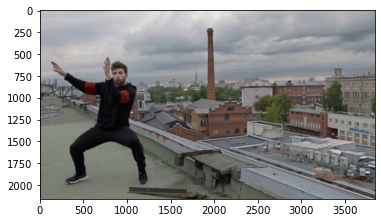

In [15]:
import matplotlib.pyplot as plt
shot = clip.get_frame(1)
plt.imshow(shot)
plt.show()

In [9]:
# construct the argument parse and parse the arguments
ap = argparse.ArgumentParser()
ap.add_argument("-i", "--input", required=True, help="path to input video file")
ap.add_argument("-o", "--output", required=True, help="path to output video file")
ap.add_argument("-f", "--filter", required=True, choices=['grey_back', 'blur_back', 'bright_object', 'sharp_object',
                                                          'sharp_back', 'cartoon_back'], help="filter to be used")
args = vars(ap.parse_args())

usage: ipykernel_launcher.py [-h] -i INPUT -o OUTPUT -f
                             {grey_back,blur_back,bright_object,sharp_object,sharp_back,cartoon_back}
ipykernel_launcher.py: error: argument -f/--filter: invalid choice: 'C:\\Users\\amart\\AppData\\Roaming\\jupyter\\runtime\\kernel-0a8ef89b-37fc-42ea-b7d2-c4bf56bd67c1.json' (choose from 'grey_back', 'blur_back', 'bright_object', 'sharp_object', 'sharp_back', 'cartoon_back')
ERROR:root:Internal Python error in the inspect module.
Below is the traceback from this internal error.



Traceback (most recent call last):
  File "C:\Users\amart\anaconda3\envs\keras-gpu\lib\argparse.py", line 1766, in parse_known_args
    namespace, args = self._parse_known_args(args, namespace)
  File "C:\Users\amart\anaconda3\envs\keras-gpu\lib\argparse.py", line 1972, in _parse_known_args
    start_index = consume_optional(start_index)
  File "C:\Users\amart\anaconda3\envs\keras-gpu\lib\argparse.py", line 1912, in consume_optional
    take_action(action, args, option_string)
  File "C:\Users\amart\anaconda3\envs\keras-gpu\lib\argparse.py", line 1824, in take_action
    argument_values = self._get_values(action, argument_strings)
  File "C:\Users\amart\anaconda3\envs\keras-gpu\lib\argparse.py", line 2266, in _get_values
    self._check_value(action, value)
  File "C:\Users\amart\anaconda3\envs\keras-gpu\lib\argparse.py", line 2318, in _check_value
    raise ArgumentError(action, msg % args)
argparse.ArgumentError: argument -f/--filter: invalid choice: 'C:\\Users\\amart\\AppData\\Roami

TypeError: object of type 'NoneType' has no len()

In [196]:
def brightnessControl(image, level):
    return cv2.convertScaleAbs(image, beta=level)

In [22]:
def pencil_sketch(image):
    gray_image = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)
    img_gray_inv = 255 - gray_image
    img_blur = cv2.GaussianBlur(img_gray_inv, ksize=(21, 21), sigmaX=0, sigmaY=0)
    def dodge(image, mask):
        return cv2.divide(image, 255-mask, scale=256)
    return dodge(gray_image,img_blur)

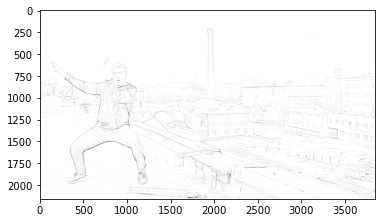

In [23]:
x = pencil_sketch(shot)
plt.imshow(x, cmap='gray')
plt.show()

In [215]:
def auto_canny(image, sigma=0.33):
# compute the median of the single channel pixel intensities
    v = np.median(image)
# apply automatic Canny edge detection using the computed median
    lower = int(max(0, (1.0 - sigma) * v))
    upper = int(min(255, (1.0 + sigma) * v))
# return the edged image
    return cv2.Canny(image, lower, upper)

In [265]:
def cartoonizer(img_rgb):
    numDownSamples = 2       # number of downscaling steps
    numBilateralFilters = 7  # number of bilateral filtering steps
    # -- STEP 1 --
    # downsample image using Gaussian pyramid
    img_color = img_rgb
    for _ in range(numDownSamples):
        img_color = cv2.pyrDown(img_color)

    # repeatedly apply small bilateral filter instead of applying
    # one large filter
    for _ in range(numBilateralFilters):
        img_color = cv2.bilateralFilter(img_color, 9, 9, 7)

    # upsample image to original size
    for _ in range(numDownSamples):
        img_color = cv2.pyrUp(img_color)

    # make sure resulting image has the same dims as original
    img_color = cv2.resize(img_color, (img_rgb.shape[1],img_rgb.shape[0]))

    # -- STEPS 2 and 3 --
    # convert to grayscale and apply median blur
    img_gray = cv2.cvtColor(img_rgb, cv2.COLOR_RGB2GRAY)
    img_blur = cv2.medianBlur(img_gray, 7)

    # -- STEP 4 --
    # detect and enhance edges
    img_edge = cv2.adaptiveThreshold(img_blur, 255, cv2.ADAPTIVE_THRESH_MEAN_C, cv2.THRESH_BINARY, 9, 2)

    # -- STEP 5 --
    # convert back to color so that it can be bit-ANDed with color image
    img_edge = cv2.cvtColor(img_edge, cv2.COLOR_GRAY2RGB)
    return cv2.bitwise_and(img_color, img_edge)

In [11]:
CLASS_NAMES = [
    'BG', 'person', 'bicycle', 'car', 'motorcycle', 'airplane',
    'bus', 'train', 'truck', 'boat', 'traffic light',
    'fire hydrant', 'stop sign', 'parking meter', 'bench', 'bird',
    'cat', 'dog', 'horse', 'sheep', 'cow', 'elephant', 'bear',
    'zebra', 'giraffe', 'backpack', 'umbrella', 'handbag', 'tie',
    'suitcase', 'frisbee', 'skis', 'snowboard', 'sports ball',
    'kite', 'baseball bat', 'baseball glove', 'skateboard',
    'surfboard', 'tennis racket', 'bottle', 'wine glass', 'cup',
    'fork', 'knife', 'spoon', 'bowl', 'banana', 'apple',
    'sandwich', 'orange', 'broccoli', 'carrot', 'hot dog', 'pizza',
    'donut', 'cake', 'chair', 'couch', 'potted plant', 'bed',
    'dining table', 'toilet', 'tv', 'laptop', 'mouse', 'remote',
    'keyboard', 'cell phone', 'microwave', 'oven', 'toaster',
    'sink', 'refrigerator', 'book', 'clock', 'vase', 'scissors',
    'teddy bear', 'hair drier', 'toothbrush'
]

In [12]:
# generate random (but visually distinct) colors for each class label
hsv = [(i / len(CLASS_NAMES), 1, 1.0) for i in range(len(CLASS_NAMES))]
COLORS = list(map(lambda c: colorsys.hsv_to_rgb(*c), hsv))
random.seed(42)
random.shuffle(COLORS)

In [13]:
class SimpleConfig(Config):
    # give the configuration a recognizable name
    NAME = "coco_inference"
    # set the number of GPUs to use along with the number of images per GPU
    GPU_COUNT = 1
    IMAGES_PER_GPU = 1
    # number of classes (we would normally add +1 for the background but the background class is *already* included in the class
    # names)
    NUM_CLASSES = len(CLASS_NAMES)

In [14]:
# initialize the inference configuration
config = SimpleConfig()

In [15]:
# initialize the Mask R-CNN model for inference and then load the
# weights
print("[INFO] loading Mask R-CNN model...")
model = modellib.MaskRCNN(mode="inference", config=config, model_dir=os.getcwd())
model.load_weights('mask_rcnn_coco.h5', by_name=True)

W0730 11:30:38.911901  5516 deprecation_wrapper.py:119] From c:\users\amart\anaconda3\envs\keras-gpu\lib\site-packages\keras\backend\tensorflow_backend.py:517: The name tf.placeholder is deprecated. Please use tf.compat.v1.placeholder instead.

W0730 11:30:38.950309  5516 deprecation_wrapper.py:119] From c:\users\amart\anaconda3\envs\keras-gpu\lib\site-packages\keras\backend\tensorflow_backend.py:74: The name tf.get_default_graph is deprecated. Please use tf.compat.v1.get_default_graph instead.

W0730 11:30:38.975560  5516 deprecation_wrapper.py:119] From c:\users\amart\anaconda3\envs\keras-gpu\lib\site-packages\keras\backend\tensorflow_backend.py:4138: The name tf.random_uniform is deprecated. Please use tf.random.uniform instead.



[INFO] loading Mask R-CNN model...


W0730 11:30:39.197977  5516 deprecation_wrapper.py:119] From c:\users\amart\anaconda3\envs\keras-gpu\lib\site-packages\keras\backend\tensorflow_backend.py:1919: The name tf.nn.fused_batch_norm is deprecated. Please use tf.compat.v1.nn.fused_batch_norm instead.

W0730 11:30:39.218313  5516 deprecation_wrapper.py:119] From c:\users\amart\anaconda3\envs\keras-gpu\lib\site-packages\keras\backend\tensorflow_backend.py:3976: The name tf.nn.max_pool is deprecated. Please use tf.nn.max_pool2d instead.

W0730 11:30:48.907023  5516 deprecation_wrapper.py:119] From c:\users\amart\anaconda3\envs\keras-gpu\lib\site-packages\keras\backend\tensorflow_backend.py:2018: The name tf.image.resize_nearest_neighbor is deprecated. Please use tf.compat.v1.image.resize_nearest_neighbor instead.

W0730 11:30:50.599906  5516 deprecation_wrapper.py:119] From C:\Users\amart\Desktop\Python Summer Intern\Custom Filters\Keras-RCNN\Mask_RCNN\mrcnn\model.py:341: The name tf.log is deprecated. Please use tf.math.log ins

In [279]:
# This function is used to change the colorful background information to grayscale.
# image[:,:,0] is the Blue channel,image[:,:,1] is the Green channel, image[:,:,2] is the Red channel
# mask == 0 means that this pixel is not belong to the object.
# np.where function means that if the pixel belong to background, change it to gray_image.
# Since the gray_image is 2D, for each pixel in background, we should set 3 channels to the same value to keep the grayscale.
def grey_back(image, mask):
    gray_image = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)
    image[:, :, 0] = np.where(
        mask == 0,
        gray_image[:, :],
        image[:, :, 0]
    )
    image[:, :, 1] = np.where(
        mask == 0,
        gray_image[:, :],
        image[:, :, 1]
    )
    image[:, :, 2] = np.where(
        mask == 0,
        gray_image[:, :],
        image[:, :, 2]
    )
    return image

In [280]:
def blur_back(image, mask):
    blur_image = cv2.GaussianBlur(image, (35, 35), 0)
    blur_image[:,:][mask] = image[:,:][mask]
    return blur_image

In [281]:
def bright_object(image, mask):
    image[:,:][mask] = cv2.convertScaleAbs(image[:,:][mask], beta=100)
    return image

In [282]:
def sharp_object(image, mask):
    kernel = np.array([[-1, -1, -1], [-1, 9, -1], [-1, -1, -1]])
    image[:,:][mask] = cv2.filter2D(image[:,:][mask], -1, kernel)
    return image

In [283]:
def sharp_back(image, mask):
    kernel = np.array([[-1, -1, -1], [-1, 9, -1], [-1, -1, -1]])
    sharp_back = cv2.filter2D(image, -1, kernel)
    sharp_back[:,:][mask] = image[:,:][mask]
    return sharp_back

In [301]:
def cartoon_back(image, mask):
    back = cartoonizer(image)
    back[:,:][mask] = image[:,:][mask]
    return back

In [302]:
def make_frame(frame, ftr):
    # perform a forward pass of the network to obtain the results
    r = model.detect([frame], verbose=1)[0]
    # loop over of the detected object's bounding boxes and masks
    max_area = 0
    for i in range(len(r['class_ids'])):
        # extract only the largest 'person' and mask for the current detection, then grab the color to visualize 
        # the mask (in BGR format)
        if(CLASS_NAMES[r['class_ids'][i]]=='person'):
            (startY, startX, endY, endX) = r["rois"][i]
            area = (startY-endY)*(startX-endX)
            if(area>max_area):
                max_area = area
                mask = r["masks"][:, :, i]
            else:
                continue
        else:
            continue
    return ftr(frame.copy(), mask)

In [22]:
def my_transformation(clip, ftr):
    def new_transformation(frame):
        return make_frame(frame, ftr)
    return clip.fl_image(new_transformation)

In [18]:
clip = VideoFileClip(args['input'])
if(args['filter']=='grey_back'):
    modifiedClip = clip.fx(my_transformation, grey_back)
if(args['filter']=='blur_back'):
    modifiedClip = clip.fx(my_transformation, blur_back)
if(args['filter']=='bright_object'):
    modifiedClip = clip.fx(my_transformation, bright_object)
if(args['filter']=='sharp_object'):
    modifiedClip = clip.fx(my_transformation, sharp_object)
if(args['filter']=='sharp_back'):
    modifiedClip = clip.fx(my_transformation, sharp_back)
if(args['filter']=='cartoon_back'):
    modifiedClip = clip.fx(my_transformation, cartoon_back)

NameError: name 'args' is not defined

In [19]:
modifiedClip.write_videofile(args['output'])

NameError: name 'modifiedClip' is not defined